In [1]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.axes_grid1 import AxesGrid, make_axes_locatable
from glob import glob
import xarray as xr
import pandas as pd
import numpy as np1
from pyresample import geometry, create_area_def
from satpy import Scene
from cartopy.mpl.geoaxes import GeoAxes
import cmocean
import cmocean.cm as cmo
import matplotlib.cm as cm
from matplotlib import ticker

In [3]:
extent = (-93.2, 27.6, -87.6, 31)

days = []
monthfiles = glob('/home/hboi-ouri/Downloads/Ani/Sep_2021/*')
monthfiles.sort()
for period in monthfiles:
    day = period[50:58]
    if day in days:
        continue
    elif day not in days:
        days.append(day)

for day in days:
    # Functions to be used
    files = glob('/home/hboi-ouri/Downloads/Ani/Sep_2021/*'+ day +'*.L2.SST.x.nc')
    files.sort()
    print(files)
    def convtoxr(scn, var):
        #convert from dask array
        data = scn[var].load()
        data = data.where(data >= 0)
        data.name = var
        del(data.attrs['_satpy_id']) ### removing, we don't need this.
        data.attrs['area'] = str(data.attrs['area']) ### We may or may not need this in the future so converting it to a string
        return data

    def load_satdata(path, 
                     area_deff=None,
                     res=None,
                     name="GOMEX", proj={"proj": "laea"}, area_extent=extent,
                    ):
    #   get data and attributes
        data = xr.open_dataset(path, group='geophysical_data')
        navigation = xr.open_dataset(path, group='navigation_data')
        navigation = navigation.rename({'pixel_control_points': 'pixels_per_line'})
        attrs = xr.open_dataset(path).attrs

    #   area definition if not defined
        if res is None:
            # get the resolution of the Sat product
            val, unit = attrs['spatialResolution'].split()
            res  = xr.DataArray(float(val), attrs={"units": unit})
        if area_deff is None:
            area_deff = create_area_def(name, proj, area_extent=area_extent, units="degrees", resolution=res)

    #   reprojecting
        scn = Scene()
        swath_def = geometry.SwathDefinition(lons=navigation.longitude, lats= navigation.latitude)
        vnames = [v for v in data.data_vars if 'sst' in v]
        for var in vnames:
            scn[var] = data[var]
            scn[var].attrs["area"] = swath_def
        resampled_scn = scn.resample(area_deff, radius_of_influence=int(res))
        resampled_scn.compute()
        lons, lats = resampled_scn[vnames[0]].attrs['area'].get_lonlats()
    #   Converting back to xarray dataset
        ds = xr.merge([convtoxr(resampled_scn, var) for var in vnames])
        ds.attrs = attrs
        ds = ds.assign_coords({
                                'lon': (('y', 'x'), lons),
                                'lat': (('y', 'x'), lats),
                                'time': pd.to_datetime(attrs['time_coverage_start'])
                                })
    #   getting rid of the crs coord
        ds = ds.drop('crs')
        return ds

    # Area setup for GOMEX
    resval = 1000 # resolution of the sat product (300 m for Sentinel and MERIS, 1 km for MODIS)
    res = xr.DataArray(resval, attrs={"units": "meters"})
    lat_0, lon_0 = 28.5, -90.8 # just some rounded up mean from the lat lon range of the sat product
    proj = {'proj': 'laea', 'lat_0': lat_0, 'lon_0': lon_0, 'a': 6371228.0, 'units': 'm'} # projection object
    area = create_area_def("FLBay", proj,
                           area_extent=extent, units="degrees", 
                           resolution=res
                          ) # creating a fixed area to reproject to

    # Reprojectig files
    dsets = [load_satdata(f, area_deff=area, res=res) for f in files] # looping trough the files
    combined = xr.concat(dsets, dim='time') #combining in one file


    #save combined file
    # give a sensible name i.e. cruiseID_satID.nc for every cruise and satelite

    savefile = '/home/hboi-ouri/Downloads/Ani/Combined Files/'+ day +'_MODIS_SST.nc'
    combined.to_netcdf(savefile)

Rounding shape to (380, 542) and resolution from (1000.0, 1000.0) meters to (999.0798276127949, 999.6147938626385) meters


['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210901T192000.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210901T192500.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210902T182501.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210902T183001.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210902T200501.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210903T191001.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210904T181501.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210904T195000.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210904T195501.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210905T185501.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210905T190001.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210906T194000.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210907T184501.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210908T193001.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210909T183500.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210909T201000.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210909T201500.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210910T191501.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210911T182001.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210911T200001.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210912T190501.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210913T194501.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210913T195001.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210914T185000.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210914T185500.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210915T193501.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210916T184001.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210916T201501.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210917T192000.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210917T192500.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210918T182501.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210918T183001.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210918T200501.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210919T191001.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210920T181500.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210920T195000.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210920T195500.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210921T185501.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210921T190001.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210922T194001.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210923T184501.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210924T193001.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210925T183500.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210925T201000.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210925T201500.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210926T191501.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210927T182001.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210927T200001.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210928T190500.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210929T194501.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210929T195001.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

['/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210930T185001.L2.SST.x.nc', '/home/hboi-ouri/Downloads/Ani/Sep_2021/AQUA_MODIS.20210930T185500.L2.SST.x.nc']


/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)
/home/hboi-ouri/miniconda3/envs/Satpy/lib/python3.8/site-packages/pyproj/crs/crs.py:1296: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinat

/tmp/ipykernel_4687/2042089125.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(9,6))


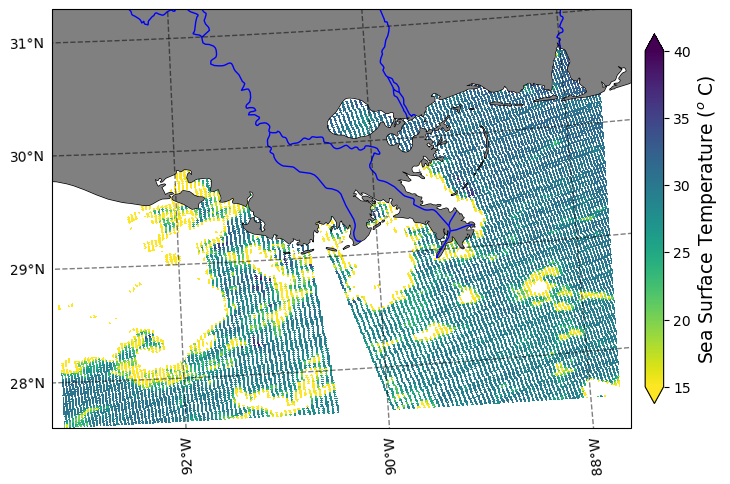

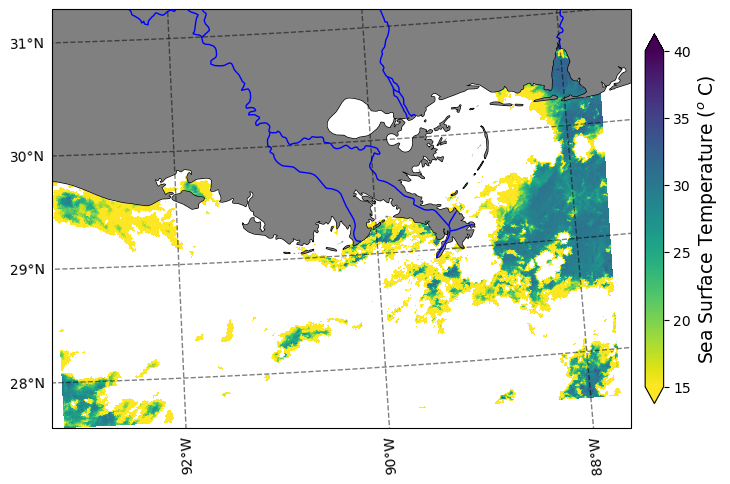

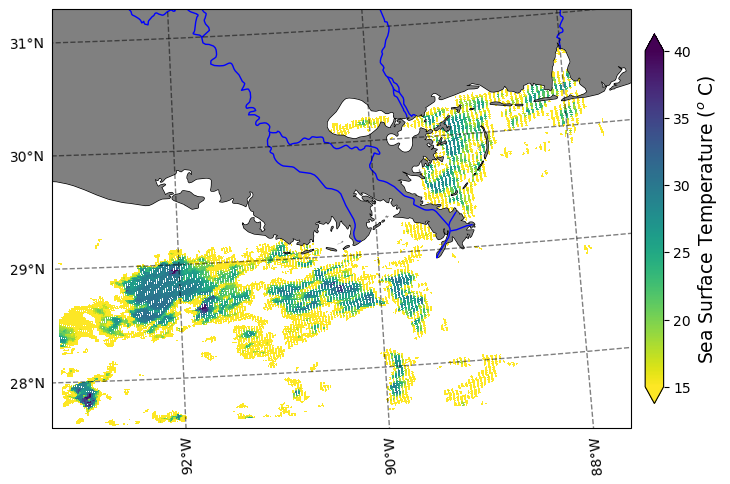

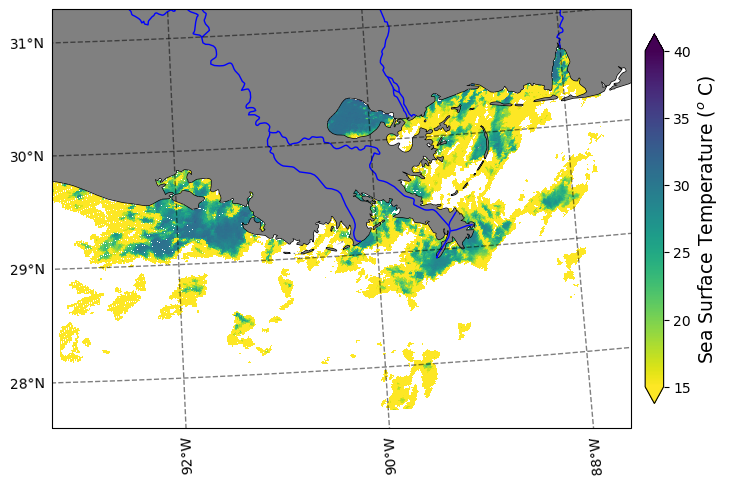

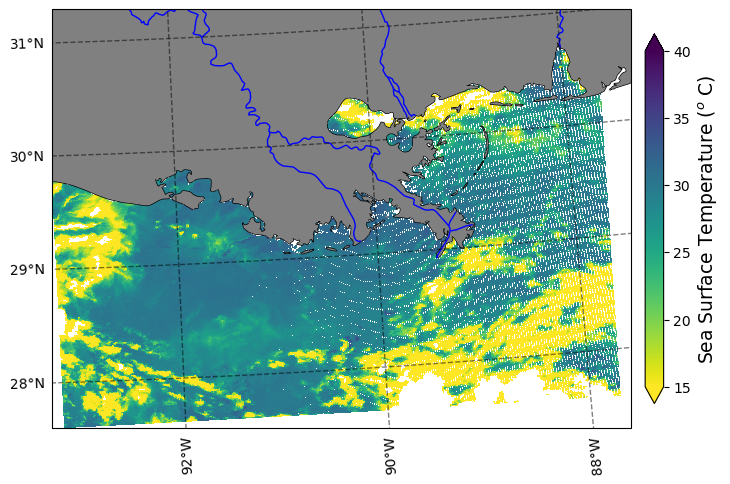

...

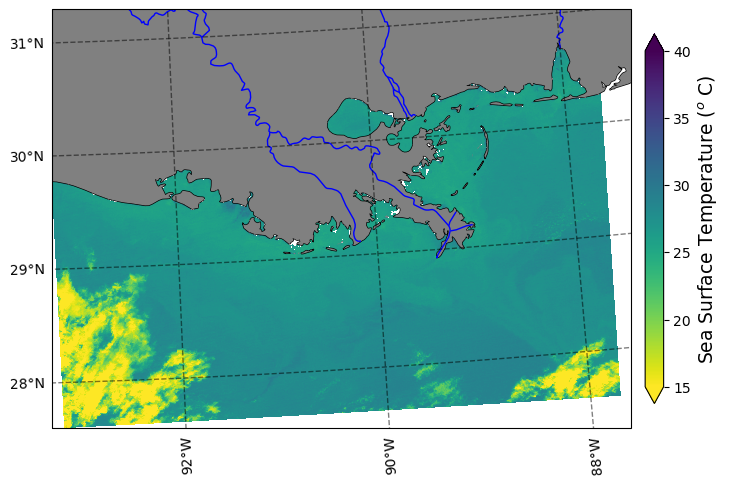

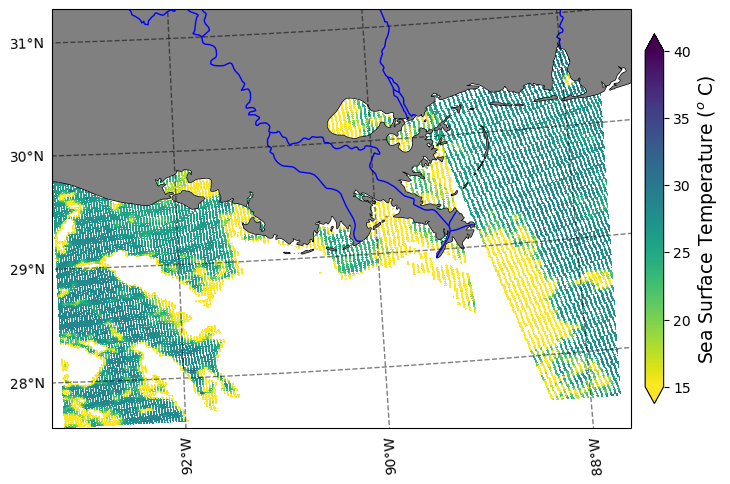

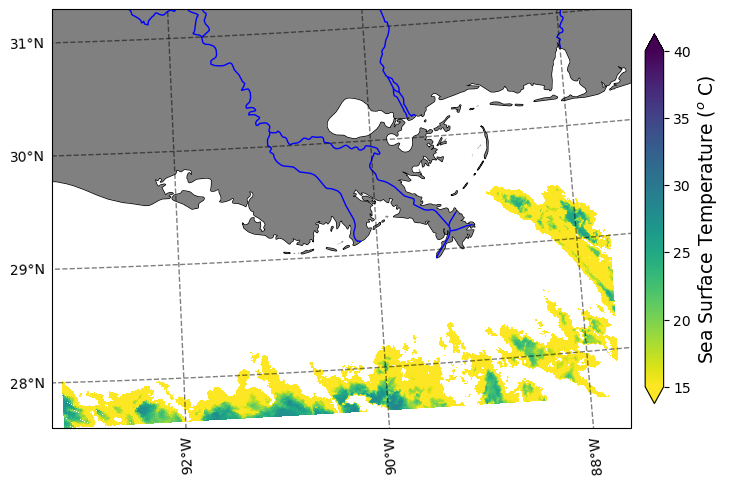

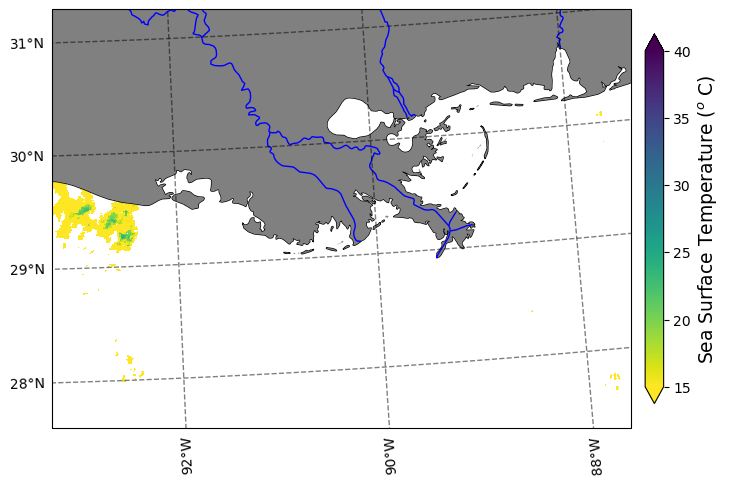

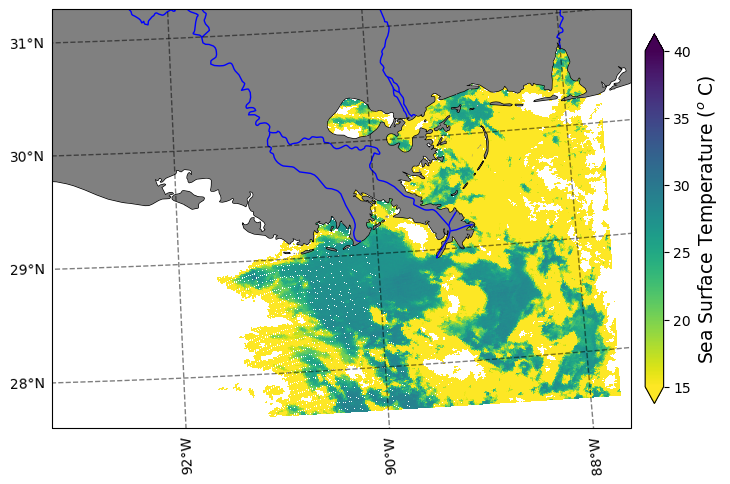

In [3]:
#Change for your file system
cfile = glob('/home/hboi-ouri/Downloads/Ani/Combined Files/*_MODIS_SST.nc')
cfile.sort()

#You may or may not need to change the extent
extent = (-93.2, -87.6, 31, 27.6)

resval = 1000
res = xr.DataArray(resval, attrs={"units": "meters"})

projection = ccrs.PlateCarree()


for file in cfile:
    fig = plt.figure(figsize=(9,6))
    ax = fig.add_subplot(1,1,1,
                     projection=ccrs.LambertConformal())   
    ###Change the numbers inside file[:] so that "day" gives you a date in YYYYMMDD format
    day = file[45:53]
    ds = xr.open_dataset(file)
    data = ds.sst.mean('time')

    ###Change the "vmin" and "vmax" values here to give you better-looking figures. THis sets the min and max values for your colorbar
    im = data.where(data!=0).plot(ax=ax, vmin=15, vmax=40, 
                                  x='lon', y='lat', 
                                  add_colorbar=False,
                                 transform=ccrs.PlateCarree(),
                                 cmap='viridis_r')
    ax.coastlines()
    ax.set_extent(extent)
    ax.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                                name='land',
                                                facecolor='grey', # change color here
                                                scale='10m')) 
    ax.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                                name='rivers_lake_centerlines',
                                                edgecolor='blue', # change color here
                                                facecolor='none',
                                            scale='10m'))
    gl = ax.gridlines(crs=ccrs.PlateCarree(),
#If you change your extent, it may be worth adding some xlocs or ylocs, which creates grid lines for lat/lon
         ylocs=[28, 29, 30, 31], 
         xlocs=[-94, -92, -90, -88], 
         draw_labels=True, linewidth=1, color='k', alpha=0.5, linestyle='--', x_inline=False, y_inline=False)
    gl.right_labels = False
    gl.top_labels = False

    cb = fig.colorbar(im, ax=ax, shrink=0.8, extend='both', pad=0.02)
    #It may be best to 
    cb.set_label('Sea Surface Temperature ($^{o}$ C)', size=13.5)
    
    fig.savefig('/home/hboi-ouri/Downloads/Ani/Outputs/'+day+'MODISSST.png')
        
# title = ['January 2022', 'February 2022', 'March 2022', 'April 2022', 'May 2022', 'June 2022',
#          'July 2022', 'August 2022', 'September 2022', 'October 2022', 'November 2022', 'December 2022']

    
# fig.suptitle(year+' Chlorophyll-a Concentration', size=18)


In [19]:

path = '/home/hboi-ouri/Downloads/Ani/Aug_2021/AQUA_MODIS.20210801T182501.L2.SST.x.nc'

data = xr.open_dataset(path, group='geophysical_data')
data


<xarray.Dataset>
Dimensions:    (number_of_lines: 474, pixels_per_line: 82)
Dimensions without coordinates: number_of_lines, pixels_per_line
Data variables:
    sst        (number_of_lines, pixels_per_line) float32 ...
    qual_sst   (number_of_lines, pixels_per_line) float32 ...
    flags_sst  (number_of_lines, pixels_per_line) float32 ...
    bias_sst   (number_of_lines, pixels_per_line) float32 ...
    stdv_sst   (number_of_lines, pixels_per_line) float32 ...
    sstref     (number_of_lines, pixels_per_line) float32 ...
    l2_flags   (number_of_lines, pixels_per_line) int32 ...